## Project: Market Research on Public Catering in Moscow

**Customer:** a company that plans to invest in the opening of a new coffee shop in Moscow

**Task:** to explore the public catering market in Moscow in order to provide the customer with promising proposals for opening a new coffee shop.

**Data for analysis:** dataset with catering establishments in Moscow, compiled on the basis of data from Yandex Maps and Yandex Business services (summer 2022). The information posted in the Yandex Business service could have been added by users or found in public sources.

**Results of the analysis of the coffee house market in Moscow:**

- Coffee houses - this is 16.8% (1413 units) of the total number of public catering establishments in Moscow;
- There are coffee houses in all administrative districts of Moscow. **Central district is 30% of all coffee shops**. This is more than 50% higher than in the next after the Central - Northern district;
- **50% of coffee shops have less than 80 seats**;
- **Number of chain coffee shops**. Network coffee houses are 22% of the total number of all network establishments in the city of Moscow. Within the "coffee shop" category - 51% are chain stores;
- **Top-5 chain coffee houses:** Shokoladnitsa, One price coffee, Сofix, Coffeeport, Сofefest. All these coffee houses are most represented in the Central Administrative District;
- **Number of round-the-clock coffee houses: 59 pieces.** The leader of the list by the number of round-the-clock coffee houses is the Central Administrative District;
- **Ratings of coffee shops.** Average rating - 4.3 in all districts, except for one - CJSC, score - 4.2;
- **Cost of a cup of cappuccino:** The median cost of a cup of cappuccino for all districts is 165 rubles. For the Central Administrative District and CJSC (the most expensive) - 180 rubles.

**Recommendations for opening a coffee shop are given in the final part of the study.**

#### Link to the presentation: https://drive.google.com/file/d/1wY2lmlCQ1J2SYIAU_1IT35kyac2Vex-3/view?usp=share_link

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import median
import plotly.express as px
from plotly import graph_objects as go
import re
from plotly.offline import iplot
import numpy as np
import json
import folium
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster
import statistics

import warnings
#опция ignore для warnings
warnings.filterwarnings("ignore")

!pip install folium -U

## Data preprocessing

Setting functions for data processing and analysis.

In [2]:
def data_check(df, num_cols=None, cat_cols=None, cat_cols_value=None):
    """
    The data_check function is designed to perform data validation in a DataFrame.
    
    Arguments:
    - df: pandas.DataFrame - the data table to be checked.
    - num_cols: list, optional - a list of numerical columns to calculate statistical metrics.
    - cat_cols: list, optional - a list of categorical columns to count unique values.
    - cat_cols_value: list, optional - a list of categorical columns to display unique values.
    
    Displays information about the data in the table, including:
    - The total number of rows and columns in the table.
    - The number of duplicate rows.
    - The number of unique values for each categorical column (if cat_cols parameter is specified).
    - Unique values for each categorical column (if cat_cols_value parameter is specified).
    - Statistical metrics for numerical columns (if num_cols parameter is specified).
    """
    print('Total number of rows in the table:', df.shape[0])
    print('Number of columns in the table:', df.shape[1])
    print('Duplicate rows:', df.duplicated().sum())
    print('-'*45)

    if cat_cols:
        print('Number of unique values in columns:\n')
        for col in cat_cols:
            print(f'{col}: {df[col].nunique()}')
    print('-'*45)

    if cat_cols_value:
        print('Unique values of categorical columns:\n')
        for col_v in cat_cols_value:
            print(f'{col_v}:\n{df[col_v].value_counts()}\n')
    print('-'*45)
    if num_cols:
        print('Statistical metrics for numerical columns:\n')
        print(df[num_cols].describe())


In [3]:
def table_info(df):
    """
    The table_info function is designed to check the quantity and data types in a DataFrame.

    Arguments:
    - df: pandas.DataFrame - the data table to be checked.

    Returns a pandas.DataFrame containing information about each column in the table:
    - 'name_columns': column names.
    - 'total': total number of non-null values in the column.
    - 'NaN': number of missing values (NaN) in the column.
    - 'types': data type of the column.
    - 'missing_ratio': percentage of missing values relative to the total number of values in the column.

    The resulting DataFrame is sorted by the 'missing_ratio' column in descending order.
    """
    table = pd.DataFrame({
        'total': df.count(),
        'NaN': df.isnull().sum(),
        'types': df.dtypes,
        'missing_ratio': ((df.isnull().sum() / df.shape[0])*100).round(2)})  
    table = table.sort_values(by='missing_ratio', ascending=False)  # Sorting by the 'missing_ratio' column in descending order
    table = table.reset_index().rename(columns={'index': 'name_columns'})  # Adding a column with indexes
    return table


In [4]:
def create_summary_table(data, index_column, category_column, value_column, agg_function, use_head=None):
    """
    Creates a summary table with aggregated values across rows and columns.

    - use_head: int, number of rows to include in the summary table (by default, all rows)

    Returns:
    - DataFrame, a summary table with aggregated values.
    """
    summary_table = pd.pivot_table(data, index=index_column, columns=category_column, values=value_column, aggfunc=agg_function)
    summary_table['total_row'] = summary_table.sum(axis=1)
    summary_table = summary_table.sort_values(by='total_row', ascending=False)

    if use_head is not None:
        summary_table = summary_table.head(use_head)

    total_column = summary_table.sum(axis=0)
    total_row = pd.DataFrame(total_column).T
    total_row.index = ['total_columns']

    summary_table_with_total = pd.concat([total_row, summary_table])

    sorted_columns = summary_table_with_total.loc['total_columns'].sort_values(ascending=True).index
    sorted_summary_table = summary_table_with_total[sorted_columns]
    sorted_summary_table = sorted_summary_table.fillna(0)

    return sorted_summary_table


In [5]:
# Function for creating pivot tables without row and column totals

def create_pivot_table(data, index_columns, column_to_pivot, values_column, aggregation_function, sort_column=None):
    """
    Creates a pivot table from the given data based on specified parameters.

    Args:
        data (DataFrame): The input data.
        index_columns (str or list): The column(s) to be used as the index of the pivot table.
        column_to_pivot (str): The column to be pivoted.
        values_column (str): The column containing the values to be aggregated in the pivot table.
        aggregation_function (str or callable): The function used to aggregate the values.
        sort_column (str, optional): The column used for sorting the pivot table. Defaults to None.

    Returns:
        DataFrame: The resulting pivot table.

    """
    pivot_table = pd.pivot_table(data, index=index_columns, columns=column_to_pivot, values=values_column, aggfunc=aggregation_function)
    pivot_table = pivot_table.fillna(0)
    if sort_column:
        pivot_table = pivot_table.sort_values(by=sort_column, ascending=False)
    
    return pivot_table


In [6]:
# function to create a bar graph
def create_bar_chart(data, x, y, color, text, title, orientation='v'):
    if orientation == 'h':
        fig = px.bar(data, y=x, x=y, color=color, text=text, title=title)
    else:
        fig = px.bar(data, x=x, y=y, color=color, text=text, title=title)

    fig.show()

**Loading data**

In [7]:
food = pd.read_csv('/Users/yuliamazur/ПИТОН/Проект общпитание/moscow_places.csv')
food.head(2)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0


**Data Description:**

* `name` — institution name;
* `address` — address of the establishment;
* `category` - category of the establishment, for example, "cafe", "pizzeria" or "coffee shop";
* `hours` - information about the days and hours of work;
* `lat` - latitude of the geographic point where the institution is located;
* `lng` - longitude of the geographic point where the institution is located;
* `rating` — institution rating according to user ratings in Yandex Maps (the highest rating is 5.0);
* `price` — category of prices in the institution, for example, "average", "below average", "above average" and so on;
* `avg_bill` is a string that stores the average cost of an order as a range, for example:
* `middle_avg_bill` is a number with an estimate of the average bill, which is indicated only for values from the avg_bill column starting with the substring "Average bill":
* `middle_coffee_cup` is a number with an estimate of one cup of cappuccino, which is indicated only for values from the avg_bill column that begin with the substring "Price of one cup of cappuccino":
* `chain` is a number, expressed as 0 or 1, which indicates whether the establishment is a network establishment (errors may occur for small chains):
     * 0 - the institution is not a network
     * 1 - the institution is a network
* `district` - the administrative district in which the institution is located, for example, the Central Administrative District;
* `seats` is the number of seats.

In [8]:
data_check(
    food, 
    num_cols=['rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats'], 
    cat_cols=['name', 'category', 'price'], 
    cat_cols_value=['category', 'price']
)

Total number of rows in the table: 8406
Number of columns in the table: 14
Duplicate rows: 0
---------------------------------------------
Number of unique values in columns:

name: 5614
category: 8
price: 4
---------------------------------------------
Unique values of categorical columns:

category:
кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

price:
средние          2117
выше среднего     564
высокие           478
низкие            156
Name: price, dtype: int64

---------------------------------------------
Statistical metrics for numerical columns:

            rating  middle_avg_bill  middle_coffee_cup        seats
count  8406.000000      3149.000000         535.000000  4795.000000
mean      4.229895       958.053668         174.721495   108.421689
std       0.470348      1009.732845          88.951103   12

`Notes:`
1. There is enough information in the table for correct analysis: 8406 rows, 5.6 thousand names of food outlets;
2. Leading categories in terms of the number of establishments: cafes, restaurants, coffee houses;
3. Middle-price establishments predominate;
4. There are anomalous values in the table: 35,000 rubles - the average bill, 1,568 rubles - the cost of a cup of cappuccino, 1288 seats.

In [9]:
table_info(food)

,name_columns,total,NaN,types,missing_ratio
0,middle_coffee_cup,535,7871,float64,93.64
1,middle_avg_bill,3149,5257,float64,62.54
2,price,3315,5091,object,60.56
3,avg_bill,3816,4590,object,54.60
4,seats,4795,3611,float64,42.96
5,hours,7870,536,object,6.38
6,name,8406,0,object,0.00
7,category,8406,0,object,0.00
8,address,8406,0,object,0.00
9,district,8406,0,object,0.00


`Notes:`
1. There are gaps in six of the fourteen columns. In four columns, the number of gaps is more than 50%. The nature of the values in the columns does not imply their artificial filling with mean or median values.
2. Information on key columns is presented in full;
3. Data types basically correspond to their nature.

**Creating additional columns:**
1. `street` - a column with the names of streets, avenues, highways, etc. based on 'address' column;
2. `is_24_7` - a boolean column indicating whether the catering facility operates around the clock or not. Created from the 'hours' column.

In [10]:
# create food['street']

food['street'] = food['address'].str.split(',', expand=True)[1].str.strip()
food[['address', 'street']].tail()

,address,street
8401,"Москва, Профсоюзная улица, 56",Профсоюзная улица
8402,"Москва, Пролетарский проспект, 19, корп. 1",Пролетарский проспект
8403,"Москва, Люблинская улица, 112А, стр. 1",Люблинская улица
8404,"Москва, Люблинская улица, 112А, стр. 1",Люблинская улица
8405,"Москва, Россошанский проезд, 6",Россошанский проезд


In [11]:
# create food['is_24_7']

food['is_24_7'] = food['hours'].str.contains('ежедневно, круглосуточно')
food[['hours', 'is_24_7']].tail()

,hours,is_24_7
8401,"ежедневно, 09:00–02:00",False
8402,"ежедневно, 08:00–22:00",False
8403,"ежедневно, круглосуточно",True
8404,"ежедневно, круглосуточно",True
8405,"ежедневно, круглосуточно",True


**Identification of implicit duplicates in the column with the names of catering facilities**

In [12]:
# search for titles in uppercase

mask = food['name'].str.isupper()
uppercase_names = food.loc[mask, 'name']
uppercase_names

197           ОШ
548     КОФЕПОРТ
592          НТС
643         СССР
725       CHICKO
          ...   
7308       ФО 89
7933          ОШ
7972        СССР
8187          ТК
8209          М5
Name: name, Length: 81, dtype: object

In [13]:
# create a new column with object names in lowercase
food['name_lower'] = food['name'].str.lower()

# checking for implicit duplicates
food.duplicated(subset=['name_lower', 'address', 'lat']).sum()

1

In [14]:
# check column 'name_lower' for implicit duplicates
food[food.duplicated(subset=['name_lower', 'address', 'lat'], keep = False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,name_lower
1430,More poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0,Волоколамское шоссе,False,more poke
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,Волоколамское шоссе,False,more poke


Removing a duplicate.

In [15]:
food.drop_duplicates(subset=['name_lower', 'address', 'lat'], keep='first', inplace=True)

In [16]:
food.query('name_lower == "more poke"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7,name_lower
1430,More poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0,Волоколамское шоссе,False,more poke
6088,More Poke,ресторан,"Москва, Духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,1,NaN,Духовской переулок,False,more poke


# Data analysis

## Distribution of establishments by categories

We evaluate the distribution of catering establishments by categories. We check if there are overlaps within the categories: how exactly the categories correlate with the names of establishments in order to eliminate gross errors in the definition of categories in the dataset.

In [17]:
#function for creating a table that separates the names of establishments by category. Shows the first 12 lines.
def table_category(data):
    categories = data['category'].unique()
    df = pd.DataFrame(columns=categories, index=[])
    for category in categories:
        names = data[data['category'] == category]['name_lower'].head(12)
        df[category] = names.tolist()
    return df 

In [18]:
table_category(food)

,кафе,ресторан,кофейня,пиццерия,"бар,паб",быстрое питание,булочная,столовая
0,wowфли,четыре комнаты,dormouse coffee shop,иль марко,огни города,mr. уголёк,буханка,дом обеда
1,хазри,donna maria,в парке вкуснее,sergio pizza,great room bar,шаурму х@чу,пекарня,час-пик
2,готика,чайхана беш-бармак,9 bar coffee,пикочино,у сильвы,алталия,буханка,кушай город
3,шашлык шефф,изба,cofefest,додо пицца,пить есть!,шаурмагия,кафедра,дежене
4,заправка,суши & пицца,cofix,домино'с пицца,штаб квартира,крошка картошка,ижора,булкер
5,база стритфуд,блинбери,royal coffee,виладж пицца,гуава бар,варня кафе,арамье,обжора
6,чебуреки манты,кафе лоза,coffeekaldi's,2u-ту-ю,ресторан landau cafe & grill bar,шаурма,meat doner kebab,полярная звезда
7,7/12,алазанская долина,чебуречная история,pizza hut,гриль хаус,шашлык,шашлык,тайна
8,крымские чебуреки,веранда,testo мания,zамания,жигулевское,рыба из тандыра,шаурмовик,сеть кафе зарядка
9,drive café,ресторан купец,молинари,домино'с пицца,кафе,пиросмани,скалка,sport club g5+


`Notes:`

1. There are intersections in almost every category, we will take this into account in the analysis. Intersections are not critical;
2. Cafe category is a mixed group;
3. The most "clean" categories - pizzeria, bakery.

Number of establishments by category.

In [19]:
food['category'].value_counts()

кафе               2378
ресторан           2042
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

### Graph "Number of catering facilities by categories in percentage terms"

In [20]:
# Getting the number of establishments by categories and sorting them
category_counts = food['category'].value_counts().sort_values()

# Getting the total number of establishments
total_counts = len(food)

# Calculating percentages for each category
category_percentages = category_counts / total_counts * 100

# Creating a bar chart
fig = px.bar(
    category_counts,
    x=category_counts.values,
    y=category_counts.index,
    orientation='h',
    title='Number of Establishments by Categories in Percentage',
    width=700,
    height=500,
    text=category_percentages.apply(lambda x: f'{x:.1f}%')
)

# Adding percentages inside the bars
fig.update_traces(textposition='inside')

# Removing the legend and adding axis labels
fig.update_layout(
    showlegend=False,
    xaxis_title='Number of Establishments',
    yaxis_title='Categories'
)

fig.show()

`Notes:`

1. Leaders: cafe (28.3%), restaurant (24.3%), coffee house (16.8%);
2. Least of all in the Moscow catering market are bakeries and canteens
3. Bars and pubs are seriously inferior in popularity to cafes, restaurants and even coffee houses;
4. Pizzerias and fast food are overlapping categories. A pizzeria can also be fast food and vice versa. In sum, these two categories are represented on the market in almost the same way as coffee houses.

### Analysis of the number of seats

Important! Data on the number of places - information from open sources, it may differ from the actual number of places in institutions.

Abnormal values were detected during the preprocessing step. Let's define the boundary for cutting off anomalies.

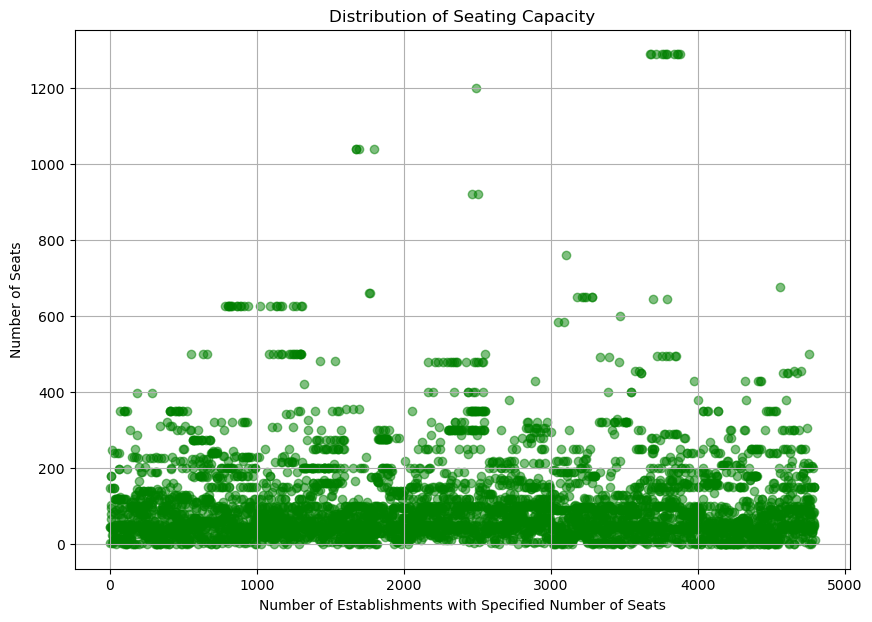

count    4794.000000
mean      108.405090
std       122.840831
min         0.000000
5%          6.000000
25%        40.000000
50%        75.000000
75%       140.000000
95%       307.000000
max      1288.000000
Name: seats, dtype: float64


In [21]:
# Extracting 'seats' values without NaN
plt.figure(figsize=(10, 7))
seats = food['seats'].dropna()

# Creating a scatter plot for the number of seats
plt.scatter(range(len(seats)), seats, color='green', alpha=0.5)

plt.grid(True)
plt.ylabel('Number of Seats')
plt.xlabel('Number of Establishments with Specified Number of Seats')
plt.title('Distribution of Seating Capacity')

plt.show()

# Displaying the data description for the number of seats
print(food['seats'].describe(percentiles=[.05, .25, .5, .75, .95]))


* Only 5% of establishments have more than 307 seats, and the maximum number is 1288;
* It is necessary to check the values of the number of seats in institutions by category.

In [22]:
# Determine the maximum, minimum, average and median by the number of places of objects in the context of categories

table_seats = food.pivot_table(index='category', values='seats', aggfunc=['count', 'min', 'max', 'mean', 'median'])
table_seats.columns = ['seats_total', 'min', 'max', 'avg', 'median']
table_seats.round().sort_values(by='seats_total', ascending=False)

,seats_total,min,max,avg,median
category,,,,,
ресторан,1269,0.0,1288.0,122.0,86.0
кафе,1218,0.0,1288.0,98.0,60.0
кофейня,751,0.0,1288.0,111.0,80.0
"бар,паб",468,0.0,1288.0,125.0,82.0
пиццерия,427,0.0,1288.0,94.0,55.0
быстрое питание,349,0.0,1040.0,99.0,65.0
столовая,164,0.0,1200.0,100.0,76.0
булочная,148,0.0,625.0,89.0,50.0


- For all categories, the values in terms of the number of places in institutions look overestimated;
- Remove abnormal values at the 5% level from the top, and make the minimum value 5, which will level out the minimum zero values.

In [23]:
table_seats = food.query('5<seats<=307').pivot_table(index='category', values='seats', aggfunc=['count', 'min', 'max', 'mean', 'median', 'std'])
table_seats.columns = ['count_places_with_seats', 'min', 'max', 'avg', 'median', 'std']
table_seats.round().sort_values(by='count_places_with_seats', ascending=False)

,count_places_with_seats,min,max,avg,median,std
category,,,,,,
ресторан,1167,6.0,307.0,103.0,83.0,70.0
кафе,1092,6.0,306.0,84.0,60.0,66.0
кофейня,673,6.0,306.0,95.0,80.0,72.0
"бар,паб",433,6.0,307.0,96.0,80.0,69.0
пиццерия,395,6.0,300.0,82.0,52.0,70.0
быстрое питание,296,6.0,306.0,97.0,75.0,77.0
столовая,151,6.0,300.0,85.0,75.0,61.0
булочная,128,6.0,300.0,90.0,56.0,76.0


The median and mean values are still excessively high, especially for the "bakery" category. Data on restaurants and cafes and canteens look plausible.

### Graph of the distribution of the number of seats by category

In [24]:
# Selecting the mean and median values
seats_mean_median = table_seats[['avg', 'median']]

# Sorting in descending order by median value
seats_mean_median = seats_mean_median.sort_values(by='median', ascending=False)

# Creating a figure object for the plot
fig = go.Figure()

# Adding a bar for the mean value
fig.add_trace(go.Bar(
    x=seats_mean_median.index,
    y=seats_mean_median['avg'],
    name='Mean',
    marker=dict(color='#3fb4eb')
))

# Adding a bar for the median value
fig.add_trace(go.Bar(
    x=seats_mean_median.index,
    y=seats_mean_median['median'],
    name='Median',
    marker=dict(color='#ed880c')
))

# Configuring the layout of the plot
fig.update_layout(
    title='Mean and Median of Seating Capacity by Categories',
    xaxis_title='Categories',
    yaxis_title='Number of Seats',
    width=600,
    height=400
)

fig.show()


`Notes:`
- The schedule can be considered informative only for restaurants and bars. Given that the data is taken from open sources, information should be treated very critically;
- Top 3 in terms of the number of seats: restaurant - 83 seats (average), bars, pubs - 80, coffee houses - 80.

## Ratio of network and non-chain establishments


Let's check the ratio of network establishments to non-chain establishments. It is known that not all institutions have the correct value in this column. Chain establishments must have more than one facility. Let's count how many such objects that have only one institution in Moscow, but are marked as network ones. Let's build a pie chart of the percentage of the total number of establishments and a graph by category.

In [25]:
# check how many network with one object
chain_check = food.query('chain == 1').value_counts('name')
len(chain_check[chain_check == 1])

65

A total of 65 objects are presented as network objects, but there is only one name of the institution in the dataset. This is a small number of the total number of establishments. This may also be due to the fact that other objects of these "networks" may not be located in Moscow. Therefore, we leave these objects in the calculations.

Let's build a pie chart distribution of network-non-network from the total number of objects.

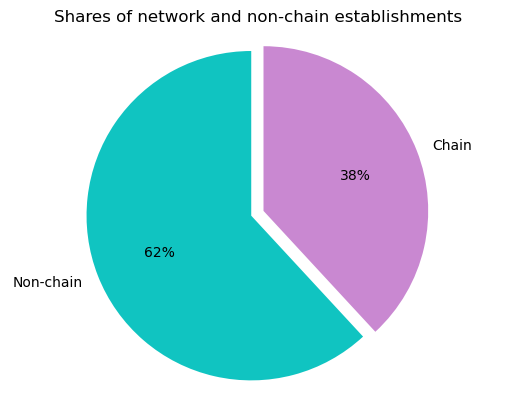

In [73]:
chain_counts = food['chain'].value_counts()
labels = ['Non-chain', 'Chain']
colors = ['#10c4c1','#c988d1']
explode = (0.08, 0)

plt.pie(chain_counts, labels=labels, colors=colors, explode=explode, autopct='%1.f%%', startangle=90)
plt.axis('equal')

plt.title('Shares of network and non-chain establishments')
plt.show()

There are more non-chain establishments, 62% versus 38%

### Graph of the percentage of network objects to non-network objects by category

In [27]:
# Calculation of shares of network and non-chain establishments in each category
chain = food.pivot_table(index='category', values='chain', aggfunc=['count', 'sum'])
chain.columns = ['total_places', 'chain_network']

chain = chain.assign(chain_percentage = round(chain['chain_network'] / chain['total_places'] * 100))
chain = chain.assign(nonchain_percentage = round((chain['total_places'] - chain['chain_network']) / chain['total_places'] * 100))

chain = chain.sort_values(by='chain_percentage', ascending=False)

# Create a bar chart
fig = go.Figure(data=[
    go.Bar(name='Chain obects', x=chain.index, y=chain['chain_percentage'], text=chain['chain_percentage'],
           texttemplate='%{y}%', marker_color='#8d3f96'),
    go.Bar(name='Non-chain objects', x=chain.index, y=chain['nonchain_percentage'], text=chain['nonchain_percentage'],
           texttemplate='%{y}%', marker_color='#c7b5c9')
])

fig.update_xaxes(title='Category')
fig.update_yaxes(title='Percentage', range=[0, 100])
fig.update_layout(
    barmode='stack',
    legend=dict(
        title='Object type',
        font=dict(size=12),
        orientation='h',
        yanchor='bottom',
        y=1.02,
        xanchor='right',
        x=1
    ),
    title='Percentage of chain and non-chain objects by category'
)

fig.show()

`Notes:`
- Leader in the share of network establishments - bakeries (61%);
- Pizzerias and coffee houses are almost equal, half of the establishments in these categories are chain stores. This may be due to the popularity of franchises for such properties;
- The minimum number of networks in bars and pubs. This category contains the most "author's" individual projects.

### Top 15 popular chains in Moscow
Popularity refers to the number of establishments of this network. We visualize this data. Let's find patterns and similarities.

Given that the categories of objects overlap, let's look at the data of the entire table to see if we are losing any objects when grouping by category.

In [28]:
def get_column_counts(df, column_name, use_head=None):
    column_counts = df[column_name].value_counts().reset_index()
    column_counts.columns = [column_name, 'count']
    if use_head is not None:
        column_counts = column_counts.head(use_head)
    return column_counts

In [29]:
# таблица без группировки по категориям
food_name_counts = food['name_lower'].value_counts().head(15).reset_index()
food_name_counts.columns = ['name_lower', 'count']

# таблица с группировкой по категориям
top_places = food.groupby(['name_lower', 'category'])['rating'].count().reset_index()
top_places.columns = ['name_lower', 'category', 'count']
top_places = top_places.sort_values(by='count', ascending=False).head(15).reset_index(drop=True)

# объединение таблиц
result = pd.merge(food_name_counts, top_places[['name_lower', 'count']], on='name_lower', how='outer')
result.columns=['name_lower', 'count_without_category', 'count_by_category']
result['different'] = result['count_without_category'] - result['count_by_category']

Grouping by categories showed losses in the number of establishments. "Khinkalnaya" was not included in the top 15 when grouped by category. The grouping also removed 11 objects each from Shawarma and Chaikhana, lowering their rating. We lost 30 objects at Cafe.

Let's build the distribution of the top 15 without grouping by categories, since the number of establishments is a more important factor in determining the top 15 than the breakdown into categories.

### Chart "Top-15 catering establishments in Moscow"
The rating is based on the number of objects in the catering network.

In [30]:
# Создание диаграммы
fig = px.bar(result.query('name_lower != "cofefest"'), 
             x='name_lower', 
             y='count_without_category', 
             text='count_without_category',
             width=800, 
             height=500)
             
fig.update_layout(
    title='Top 15 restaurants in Moscow',
    xaxis_title='Name',
    yaxis_title='Count'
)

fig.show()

We visualize the ratio of categories of objects included in the top 15. Let's find which categories the top 15 catering establishments belong to.

### Graph "Categories of the top 15 catering facilities in Moscow"

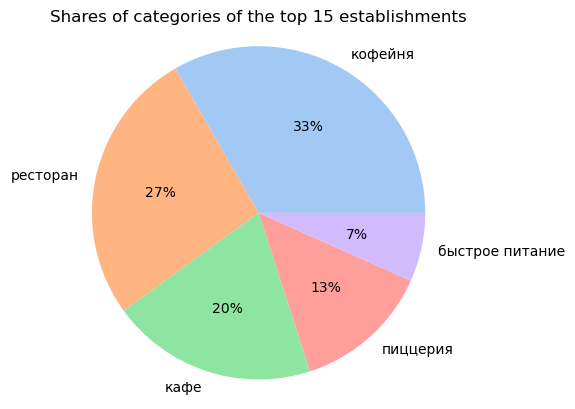

In [31]:
# Get the number of establishments in each category
category_counts = top_places['category'].value_counts()

pastel_palette = sns.color_palette('pastel')

plt.pie(category_counts, 
        labels=category_counts.index, 
        autopct='%1.f%%',
        colors=pastel_palette)

plt.axis('equal')
plt.title('Shares of categories of the top 15 establishments')

plt.show()

### Graph of the number of facilities in the top 15 catering establishments by category

In [32]:
fig = px.bar(top_places, 
             x='name_lower', 
             y='count', 
             text='count',
             color='category',  
             width=800, 
             height=500)

fig.update_layout(
    title='Top 15 restaurants in Moscow',
    xaxis_title='Name',
    yaxis_title='Count'
)

fig.show()

Let's determine which price category the top 15 objects belong to. Recall that only 45% of the establishments in the dataset have price data.

In [33]:
# Get a list of titles
name_lower_list = food_name_counts['name_lower'].tolist()

food_prices = food.query('name_lower in @name_lower_list').pivot_table(
    index='name_lower',
    columns='price',
    values='name',
    aggfunc='size'
)

food_prices.sort_values(by='средние', ascending=False)

price,высокие,выше среднего,низкие,средние
name_lower,,,,
шоколадница,NaN,2.0,1.0,49.0
домино'с пицца,NaN,NaN,1.0,39.0
кулинарная лавка братьев караваевых,NaN,NaN,2.0,26.0
хинкальная,2.0,3.0,NaN,18.0
prime,NaN,NaN,8.0,16.0
теремок,NaN,NaN,4.0,16.0
чайхана,NaN,1.0,1.0,10.0
додо пицца,NaN,NaN,NaN,8.0
кафе,1.0,NaN,NaN,4.0


We have lost 2 establishments ("Yandex store", "restaurant"), because price values are not specified for them.

`Notes:`
- Top 15 establishments in Moscow are popular catering facilities that are also familiar to residents of other Russian cities;
- Establishments from the top 15 are represented by the following categories: coffee houses (33%), restaurants (27%), cafes (20%), pizzerias (13%), fast food (7%);
- When opening a new coffee shop, it is important to take into account that 33% of coffee shops are represented by well-known chains, which means that the level of service and competition in this segment is probably above average. This fact may have an impact on the amount of investment in a new project;
- Most catering establishments offer medium or low prices. This is also important to consider when starting a project.

### Analysis of catering facilities in the context of administrative districts of Moscow

Let's display the total number of establishments and the number of establishments of each category for the districts.

In [34]:
# create a new column with a short name of the administrative districts
food['region'] = food['district'].str.split(' ').str[0].str.strip()

In [35]:
summary_table = create_summary_table(food, 'region', 'category', 'name_lower', 'count')

### Graph of the number of catering facilities by administrative districts of Moscow

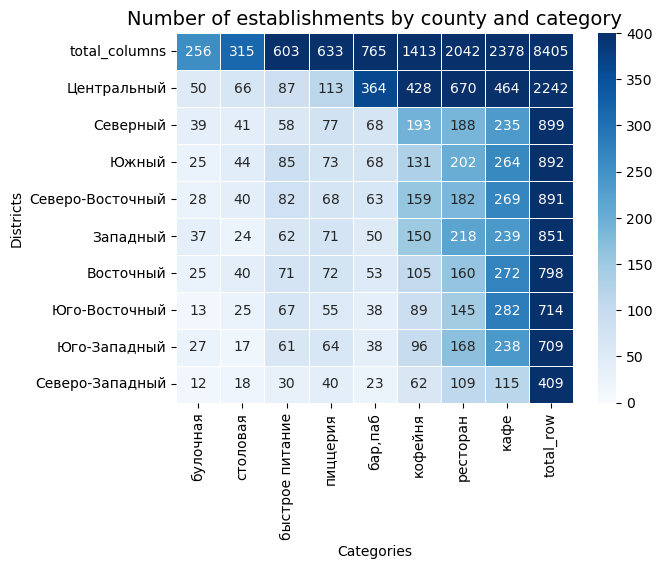

In [36]:
plt.figure()
sns.heatmap(summary_table, annot=True, fmt=".0f", linewidths=0.5, cmap='Blues', vmin=0, vmax=400)

title = 'Number of establishments by county and category'
x_label = 'Categories'
y_label = 'Districts'

plt.title(title, fontsize=14)
plt.xlabel(x_label)
plt.ylabel(y_label)

plt.xticks(rotation='vertical')

plt.show()

`Notes:`
1. The absolute leader in the total number of establishments is the Central District - 2242 catering facilities. This value is more than 50% of the second largest number of objects in the Northern District (899 items);
2. In all categories, the majority of their properties are located in the Central District;
3. Starting from the Northern District, the number of establishments is gradually decreasing;
4. The lowest number of objects in the Northwestern District.

## Analysis of the distribution of average ratings by category of establishments

Rating data can often be extremely low or high. Let's define the 5th and 95th percentiles to set the boundaries of the anomalies.

In [37]:
food['rating'].describe(percentiles=[.05, .25, .5, .75, .95])

count    8405.000000
mean        4.229899
std         0.470376
min         1.000000
5%          3.400000
25%         4.100000
50%         4.300000
75%         4.400000
95%         4.800000
max         5.000000
Name: rating, dtype: float64

Less than 5% of ratings below 3.4 and less than 5% above 4.8. Let's look at the distribution. Let's build a density graph.

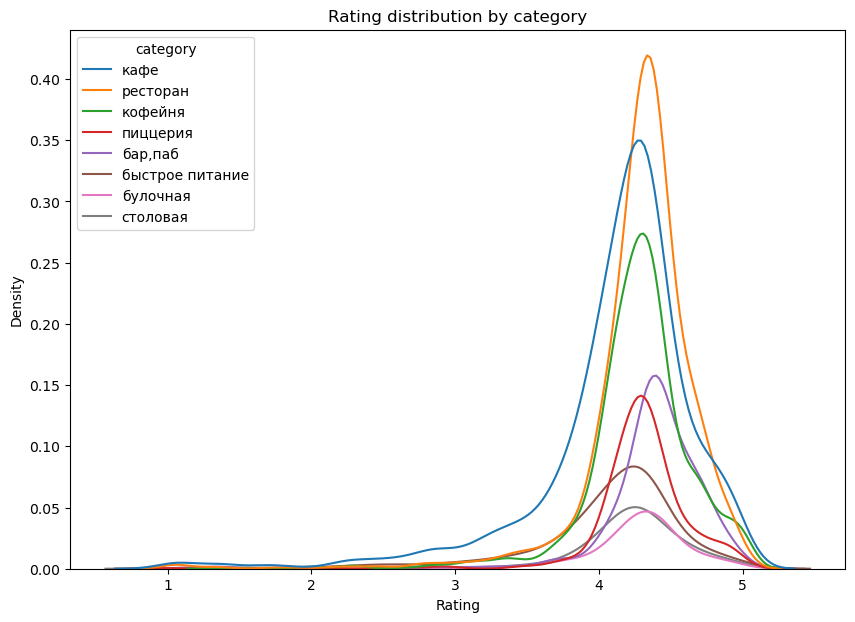

In [38]:
# Calculate the average rating for each category
rating = food.groupby('category')['rating'].mean()

plt.figure(figsize=(10,7))
sns.kdeplot(data=food, x='rating', hue='category', common_norm=True)

plt.xlabel('Rating')
plt.ylabel('Density')
plt.title('Rating distribution by category')

plt.show()

`Notes:`
1. For the "restaurant" category, the scores are focused around high scores, and the distribution has a long tail towards low scores. This may indicate that most restaurants offer quality service and food, but there are also a small number of establishments that do not meet the needs of customers;

2. For canteens and bakeries, the distribution of estimates is wide and low with a tail towards low values. This may indicate that estimates are less focused around high values;

Thus, it can be assumed that restaurants, cafes and coffee houses (higher, narrower schedules) are on average better quality, although the average rating is the same for almost all categories.

Let's display a table of the median, average and total number of ratings for each category.

In [39]:
rating_ = food.groupby('category')['rating'].agg({'count', 'mean', 'median'})
rating_.sort_values(by='count', ascending=False).round(2)

,count,mean,median
category,,,
кафе,2378,4.12,4.2
ресторан,2042,4.29,4.3
кофейня,1413,4.28,4.3
"бар,паб",765,4.39,4.4
пиццерия,633,4.30,4.3
быстрое питание,603,4.05,4.2
столовая,315,4.21,4.3
булочная,256,4.27,4.3


Everything related to ratings and ratings always has a large error, besides, we have intersections between categories of establishments, so we will display the median and average values for display on the graph.

### Linear chart of establishment ratings by category

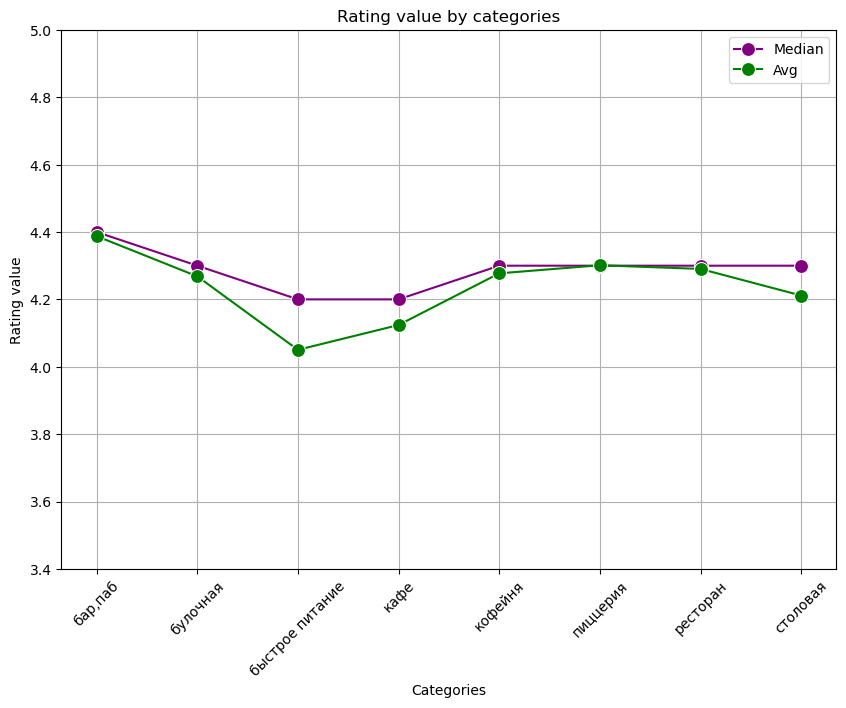

In [40]:
median_rating = food.groupby('category')['rating'].median()
mean_rating = food.groupby('category')['rating'].mean()

plt.figure(figsize=(10,7))
sns.lineplot(x=median_rating.index, y=median_rating.values, marker='o', color='purple', markersize=10)
sns.lineplot(x=mean_rating.index, y=mean_rating.values, marker='o', color='green', markersize=10)

plt.xlabel('Categories')
plt.ylabel('Rating value')
plt.title('Rating value by categories')
plt.grid(True)

plt.ylim(3.4, 5)
plt.xticks(rotation=45)

plt.legend(['Median', 'Avg'])

plt.show()

`Notes:`
- Leader in ratings - bars and pubs - 4.4;
- Outsiders - fast food and cafes - 4.2;
- The same values in the middle of the ratings - bakery, coffee shops, pizzerias, restaurants, canteens - 4.3;
- The median and the average practically do not differ for bars, bakeries, coffee houses, pizzerias, restaurants.

### Background cartogram with the average rating of establishments by administrative districts

In [41]:
#create a table with average ratings
rating_map = food.groupby('district', as_index=False)['rating'].agg('mean').round(1)

In [42]:
# load the JSON file with the borders of the districts of Moscow
state_geo = '/Users/yuliamazur/ПИТОН/Проект общпитание/admin_level_geomap.geojson'
# moscow lat - latitude of the center of Moscow, moscow lng - longitude of the center of Moscow
moscow_lat, moscow_lng = 55.751244, 37.618423

# create a map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# create a choropleth using the Choropleth constructor and add it to the map
Choropleth(
    geo_data=state_geo,
    data=rating_map,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Average rating of establishments by districts',
).add_to(m)

m

`Notes:` 
- Three rating groups have been formed on the map:
1. High rating - Central District;
2. Average rating - North, South, West, East, Southwest;
3. Low rating - North-Eastern and South-Eastern districts.

### Distribution of all catering facilities on the map of Moscow

In [43]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name_lower']} {row['rating']}",
    ).add_to(marker_cluster)

food.apply(create_clusters, axis=1)
m

`Notes:`
- Most establishments are located closer to the city center - in the Central District
- Least of all institutions are located to the South-West.

## Top 15 streets by number of establishments

Let's estimate the number of establishments in the top 15 streets by category.

In [44]:
summary_street_all = create_summary_table(food, 'street', 'category', 'name_lower', 'count', 15)
summary_street_all

category,булочная,столовая,пиццерия,"бар,паб",быстрое питание,кофейня,ресторан,кафе,total_row
total_columns,26.0,40.0,84.0,91.0,117.0,220.0,327.0,353.0,1258.0
проспект Мира,4.0,2.0,11.0,12.0,21.0,36.0,45.0,53.0,184.0
Профсоюзная улица,4.0,3.0,15.0,6.0,15.0,18.0,26.0,35.0,122.0
проспект Вернадского,1.0,2.0,12.0,7.0,12.0,16.0,33.0,25.0,108.0
Ленинский проспект,3.0,5.0,5.0,10.0,2.0,23.0,33.0,26.0,107.0
Ленинградский проспект,4.0,3.0,9.0,15.0,2.0,25.0,25.0,12.0,95.0
Дмитровское шоссе,2.0,4.0,8.0,6.0,10.0,11.0,24.0,23.0,88.0
Каширское шоссе,0.0,5.0,5.0,2.0,10.0,16.0,19.0,20.0,77.0
Варшавское шоссе,0.0,7.0,4.0,6.0,7.0,14.0,20.0,18.0,76.0
Ленинградское шоссе,2.0,3.0,3.0,5.0,5.0,13.0,26.0,13.0,70.0


In [45]:
# top 15 streets by the number of establishments located on the streets, excluding avenues, driveways, highways
top_street = food[food['street'].str.contains(r'\bулица\b', case=False)]['street'].value_counts().head(15)

In [46]:
summary_street = create_summary_table(food[food['street'].isin(top_street.index)], 'street', 'category', 'name_lower', 'count')

### Graph: number of establishments by category for the top 15 streets

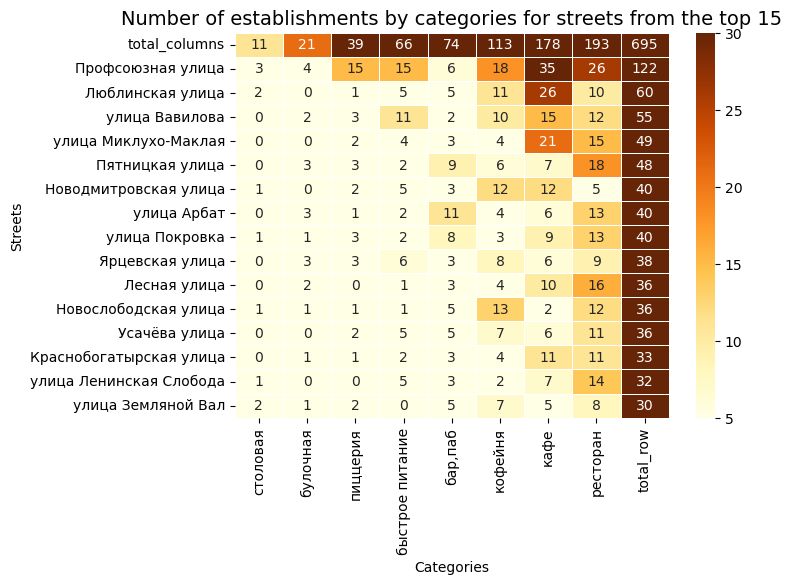

In [47]:
plt.figure(figsize=(7, 5))
sns.heatmap(summary_street, annot=True, fmt=".0f", linewidth=.5, cmap='YlOrBr', vmin=5, vmax=30)

plt.title('Number of establishments by categories for streets from the top 15', fontsize=14)
plt.xlabel('Categories')
plt.ylabel('Streets')

plt.show()

`Notes:` 
1. The leader of the top 15 streets in terms of the number of establishments is Profsoyuznaya Street. The amount of catering facilities on it is twice as much as that of the second place in the ranking - Lublinskaya Street;
2. The leader among the categories in terms of the number of objects is a cafe. 35 establishments on Profsoyuznaya Street;
3. Five streets with a large number of coffee houses - Profsoyuznaya, Novoslobodskaya, Novodmitrovskaya, Lublinskaya, Vavilova;
4. The largest number of bars and pubs is located on the Arbat.

Streets from the top 15 have different lengths, and this is important to take into account when assessing the number of catering establishments. Let's add data on the length of streets in kilometers (from open sources) and build their rating based on the number of establishments per 1 km. Let's add information about the administrative districts that own the streets.

In [48]:
summary_street_region = create_pivot_table(food[food['street'].isin(top_street.index)],\
                        ['street', 'region'], None, 'name_lower', 'count', 'name_lower')

# Создание списка длины улиц в километрах
street_length = [9.3, 8.6, 3.6, 1.8, 0.6, 1, 1.3, 1.6, 1.07, 1.6, 1.25, 4.9, 3.6, 1.6, 2.42, 4.9]
summary_street_region['street_length_km'] = street_length
summary_street_region
summary_street_region['object_per_km'] = round(summary_street_region['name_lower'] / summary_street_region['street_length_km'])

summary_street_region = summary_street_region.sort_values('object_per_km', ascending=False).reset_index()
summary_street_region.columns = ['street', 'region', 'total_object', 'street_length_km', 'object_per_km']

summary_street_region

,street,region,total_object,street_length_km,object_per_km
0,Новодмитровская улица,Северо-Восточный,40,0.60,67.0
1,улица Арбат,Центральный,40,1.00,40.0
2,Лесная улица,Центральный,36,1.07,34.0
3,улица Покровка,Центральный,40,1.30,31.0
4,Усачёва улица,Центральный,36,1.25,29.0
5,Пятницкая улица,Центральный,48,1.80,27.0
6,Ярцевская улица,Западный,38,1.60,24.0
7,Новослободская улица,Центральный,36,1.60,22.0
8,улица Ленинская Слобода,Южный,32,1.60,20.0
9,улица Миклухо-Маклая,Юго-Западный,49,3.60,14.0


### Graph of the number of establishments per 1 km from the list of top 15 streets

In [49]:
fig = px.bar(summary_street_region, 
             x='street', 
             y='object_per_km', 
             text='object_per_km',
             color='region',
             width=800, 
             height=500)
             
fig.update_layout(
    title='Number of objects per 1 km of street from the top 15 list',
    xaxis_title='Streets',
    yaxis_title='Number of objects per 1 km'
)

fig.show()

`Notes:`
1. The rating of the top 15 streets when calculating the number of establishments per 1 km differs significantly from the rating without taking into account the length of the streets. Profsoyuznaya Street was the leader in terms of the number of establishments, excluding the length. In the ranking of the number of streets per 1 km, Profsoyuznaya moved from the first place to the tenth;
2. The leaders were streets from the Central District;
3. Important: the length of Novodmitrovskaya Street is 0.6 km, the number of establishments is 40, which is why the figure of 67 establishments per 1 km was formed;
4. Vavilova Street is located in two districts at once, with an average of 11 establishments per km. In the ranking, the uditsa should take 13th place.

### Streets with one catering facility

In [50]:
# prepare a table where the number of streets is 1
street_one = food['street'].value_counts().rename_axis('street').reset_index(name='count')
street_one = street_one.query('count <= 1')

filtered_street = food[food['street'].isin(street_one['street'])]

In [51]:
print('Total number of streets:\n', food['street'].nunique())
print('-'*50)
print('Number of streets with one establishment:\n', filtered_street['name'].count())
print('-'*67)
print('Distribution of streets with one establishment by administrative districts:\n', filtered_street['district'].value_counts())
print('-'*50)
print('Distribution of establishments by category:\n', filtered_street['category'].value_counts())
print('-'*50)
print('Rating value, median:\n', filtered_street['rating'].median())
print('-'*50)
print('Average bill value, median:\n', filtered_street['middle_avg_bill'].median())
print('-'*50)
print('Number of non-24/7 and 24/7 establishments:\n', filtered_street['is_24_7'].value_counts())

Total number of streets:
 1448
--------------------------------------------------
Number of streets with one establishment:
 458
-------------------------------------------------------------------
Distribution of streets with one establishment by administrative districts:
 Центральный административный округ         145
Северо-Восточный административный округ     55
Северный административный округ             52
Восточный административный округ            52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: district, dtype: int64
--------------------------------------------------
Distribution of establishments by category:
 кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная         

In [52]:
street_adm = filtered_street['region'].value_counts()

df = pd.DataFrame({'Адм.округа': street_adm.index, 'Количество': street_adm.values})

create_bar_chart(df.sort_values(by='Количество', ascending=True), x='Адм.округа', y='Количество', 
                 title='Number of streets with one catering facility', orientation='h', color='Количество', 
                 text='Количество')

`Notes:`

"Lonely" streets are present in all districts, the largest number of them is in the Central District. Category leader - cafe. Only 7% of establishments on "lonely" streets are open around the clock. It is important to note that the objects on such streets do not at all imply a strong remoteness of these establishments from others. These may be objects that are closely spaced but have different addresses.

### Average check by administrative districts

Analyze prices in administrative districts based on the median from the `middle_avg_bill` column

In [53]:
# Prepare a table of the median value of the cost of orders in the context of districts
district_map_price = food.groupby('region', as_index=False)['middle_avg_bill'].agg('median').round(1)

In [54]:
create_bar_chart(district_map_price.sort_values(by='middle_avg_bill', ascending=True), 
                 x='region', y='middle_avg_bill', 
                 title='Медиана среднего чека в рублях по округам', 
                 orientation='h', color='middle_avg_bill', text='middle_avg_bill')

The median of the average check depends on the geographical location of the object, the closer to the center and the more traffic, the higher the cost.

The leaders of the list are the Central and Western districts (probably due to the direction towards the airport).
The lowest value is the Southeastern District.

`Notes:`
- The center and the west have higher prices in establishments.
- South, East outsiders of the list.
- North is a little better outsiders. For example, the North-West is closer in meaning to the leaders, to the center and west.

## Analysis Summary

**Data Preprocessing:**

- The table contains sufficient information for a proper analysis of food establishments: 8,406 rows and about 5.6 thousand names of food points.
- The most common categories are cafes, restaurants, and coffee shops.
- Medium-priced establishments are the most prevalent.
- Missing values in the table were left unchanged to preserve the integrity of the analysis.

**Analysis of Establishment Categories:**

- Leaders in categories are cafes (28.3%), restaurants (24.3%), and coffee shops (16.8%).
- Bars and pubs significantly lag behind in popularity compared to cafes, restaurants, and even coffee shops.
- The median number of seats is as follows: restaurant - 83, coffee shop - 80, cafe - 60, bars/pubs - 80. It's important to note that these values were obtained from open sources and may be inflated.
- Non-chain establishments constitute 62%, while chain establishments account for 38%. By category: restaurants - 36%, coffee shops - 51%, cafes - 33%. The leading category in terms of non-chain establishments is bakeries - 61%.

**Top 15 Establishments in Moscow:**

- Cafe, Shokoladnitsa, Domino's Pizza, Dodo Pizza, One Price Coffee, Yandex Lavka, Cofix, Prime, Khinkalnaya, Shawarma, Coffeepoint, Culinary Shop of the Karavaev Brothers, Teremok, Teahouse, Restaurant, Coffefest.
- 33% of these establishments belong to the "coffee shop" category, 27% are restaurants, and 20% are cafes. 
- When opening a new coffee shop, it should be considered that 33% of coffee shops are represented by well-known establishments, meaning the level of service and competition in this segment is already quite high. This directly affects the investment volume in a new project.
- The majority of establishments in the top 15 offer medium or low prices.

**Administrative Districts:**

- The absolute leader in the total number of establishments is the Central Administrative District (2242 food establishments), which is more than 50% higher than the second-ranked North Administrative District (900 establishments).
- The lowest number of establishments is found in the North-Western Administrative District.
- For each category of establishments, the majority are located in the Central Administrative District.

**Ratings of Establishments:**

- Bars and pubs lead in ratings with a rating of 4.4.
- Fast-food establishments and cafes have the lowest rating of 4.2.
- Coffee shops, restaurants, pizzerias, canteens, and bakeries have the same rating of 4.3.
- Establishments located in the Central Administrative District have the highest ratings.
- The majority of food establishments are located closer to the city center in the Central Administrative District, while the fewest establishments are located to the southwest.

**Top 15 Streets:**

- The leader in the list in terms of the total number of establishments is Prospekt Mira, represented in all categories. The leading category on this street is "cafe."
- The next street, Profsoyuznaya, has 30% fewer establishments compared to Prospekt Mira.

**Streets with One Food Establishment:**

- "Lonely" streets are present in all administrative districts, with the highest number in the Central Administrative District. The leading category is cafes. Only 7% of establishments on "lonely" streets operate 24/7.

**Average Bill:**

- The median average bill depends on the geographic location of the establishment: the closer to the center and the higher the traffic, the higher the cost.
- The leaders are the Central Administrative District (1000 rubles) and the Western Administrative District (1000 rubles), followed by the North-Western District (700 rubles) and decreasing to the minimum value of 450 rubles.

### Analysis of obejcts in the category "coffee house"

How many coffee shops are in the dataset. In which areas there are most of them, we determine the features of their location. Partially, we have already analyzed coffee houses in the first part.

In [55]:
print('Total number of establishments in the coffee shop category:', len(food.query('category == "кофейня"')))

Total number of establishments in the coffee shop category: 1413


In [56]:
# create a table with the main indicators for the coffee shop category
cafe_total = food.query('category == "кофейня"').groupby('region').agg({'category':'count', 'rating':'median', 'middle_avg_bill':'mean', 'middle_coffee_cup':'mean', 'chain':'sum', 'seats':'median', 'is_24_7':'sum'}).reset_index()
cafe_total = cafe_total.rename(columns={'region': 'Адм.округ', 'category': 'Кол-во кофеен', 'rating': 'Рейтинг медиана', 'middle_avg_bill': 'Средний чек', 'middle_coffee_cup': 'Средняя цена чашки кофе', 'chain': 'Сетевое заведение', 'seats': 'Кол-во мест медиана', 'is_24_7': 'Круглосточное заведение'})
cafe_total

,Адм.округ,Кол-во кофеен,Рейтинг медиана,Средний чек,Средняя цена чашки кофе,Сетевое заведение,Кол-во мест медиана,Круглосточное заведение
0,Восточный,105,4.3,486.111111,174.023810,51,55.0,5
1,Западный,150,4.2,694.444444,189.938776,93,96.0,9
2,Северный,193,4.3,495.736842,165.789474,97,66.0,5
3,Северо-Восточный,159,4.3,433.157895,165.333333,79,75.0,3
4,Северо-Западный,62,4.3,440.636364,165.523810,34,87.5,2
5,Центральный,428,4.3,794.764706,187.518519,221,86.0,26
6,Юго-Восточный,89,4.3,263.000000,151.088235,29,50.0,1
7,Юго-Западный,96,4.3,381.818182,184.176471,50,64.5,7
8,Южный,131,4.3,504.777778,158.488372,66,80.0,1


### Number of catering facilities in the "coffee house" category by administrative districts

In [57]:
create_bar_chart(cafe_total.sort_values(by='Кол-во кофеен', ascending=True), x='Адм.округ', y='Кол-во кофеен', 
                 title='Количество кофеен по округам', orientation='h', color='Кол-во кофеен', text='Кол-во кофеен')

Most coffee houses in the Central District. This is more than 50% more than the next after the Central Northern District. The reason is high traffic, concentration of business activity, the presence of educational institutions, government agencies and the presence of a tourist flow. Further, starting from the Northern District, the number of coffee houses is gradually decreasing.

Least of all coffee shops in the Northwestern district.

### Graph "Number of coffee houses by districts

In [58]:
district_percent = food.pivot_table(index='region', columns='category', values='name', aggfunc='count')
district_percent.columns=['бар,паб', 'булочная', 'быстрое питание', 'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']
district_percent['total_places'] = district_percent.sum(axis=1)
district_percent = district_percent.apply(lambda x: x / x['total_places'] * 100, axis=1).round()
district_percent = district_percent.reset_index()
#district_percent['district'] = district_percent['district'].str.split(' ').str[0].str.strip()
district_percent = district_percent.sort_values(by='кофейня', ascending=False)
district_percent

,region,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,total_places
2,Северный,8.0,4.0,6.0,26.0,21.0,9.0,21.0,5.0,100.0
5,Центральный,16.0,2.0,4.0,21.0,19.0,5.0,30.0,3.0,100.0
1,Западный,6.0,4.0,7.0,28.0,18.0,8.0,26.0,3.0,100.0
3,Северо-Восточный,7.0,3.0,9.0,30.0,18.0,8.0,20.0,4.0,100.0
4,Северо-Западный,6.0,3.0,7.0,28.0,15.0,10.0,27.0,4.0,100.0
8,Южный,8.0,3.0,10.0,30.0,15.0,8.0,23.0,5.0,100.0
7,Юго-Западный,5.0,4.0,9.0,34.0,14.0,9.0,24.0,2.0,100.0
0,Восточный,7.0,3.0,9.0,34.0,13.0,9.0,20.0,5.0,100.0
6,Юго-Восточный,5.0,2.0,9.0,39.0,12.0,8.0,20.0,4.0,100.0


In [59]:
fig = go.Figure()

fig.add_trace(go.Bar(
    x=district_percent['region'],
    y=district_percent['кофейня'],
    name='Кофейни',
    marker_color='rgb(255,183,98)', text=district_percent['кофейня']
))


fig.add_trace(go.Bar(
    x=district_percent['region'],
    y=district_percent['total_places'] - district_percent['кофейня'],
    name='Остальные заведения',
    marker_color='rgb(158,202,225)'
))

fig.update_layout(
    title='The ratio of the number of coffee shops to all categories by districts of Moscow',
    xaxis=dict(title='Административный округ'),
    yaxis=dict(title='Количество заведений в процентах'),
    barmode='stack',
    legend=dict(title='Категории заведений')
)

fig.show()

Leading the Northern Region. In general, the spread of values is not critical. Between the leader and the outsider, the difference is less than 50%.
Coffee houses are a popular and sought-after type of catering, present in all districts.

### Distribution of seats in the category "coffee house"
Let's evaluate the distribution of seats. Earlier we found out that the number of footprints in the data tends to non-standardly large values. Let's take this into account in our analysis.

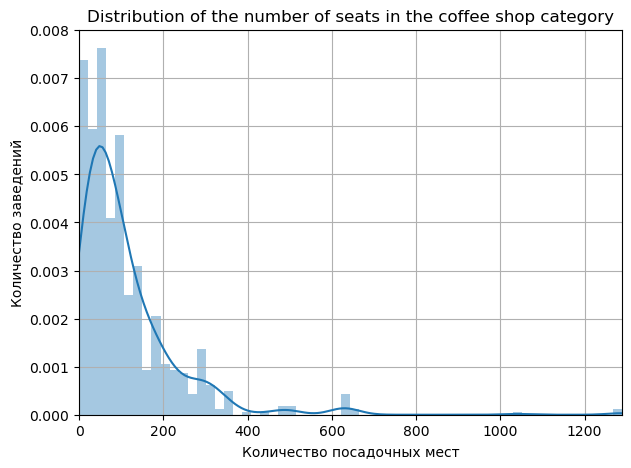

count     751.000000
mean      111.199734
std       127.837772
min         0.000000
5%          5.000000
25%        40.000000
50%        80.000000
75%       144.000000
95%       320.000000
max      1288.000000
Name: seats, dtype: float64

In [60]:
plt.figure(figsize = (7, 5))
sns.distplot(food.query('category == "кофейня"')['seats'], bins=60)

plt.xlabel('Количество посадочных мест')
plt.xlim(0, 1288)
plt.grid()
plt.ylabel('Количество заведений')
plt.title('Distribution of the number of seats in the coffee shop category')
plt.show()

food.query('category == "кофейня"')['seats'].describe(percentiles=[.05, .25, .5, .75, .95])

`Notes`

This distribution indicates that most coffee shops in the sample have fewer than 144 seats (corresponding to 75% of the sample), with an average of about 111 seats. However, the standard deviation is 127, which indicates a large scatter in the data.

The median (50%) is 80 seats, which means that 50% of coffee shops have less than 80 seats.

From this we can conclude that the sample contains both very large coffee houses (the maximum value is 1288) and very small ones (the minimum value is 0). We will focus on the median - 80 seats.

## Location of coffee shops on the map

In [61]:
# create a table of values for the coffee shop category.
cafe_map = food.query('category == "кофейня"').reset_index()

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

cafe_map.apply(create_clusters, axis=1)
m

Like all establishments of any category, coffee houses are concentrated towards the city center. The Southern and Eastern districts are noticeably behind in the number of coffee shops.

### Сетевые/несетевые кофейни

Let's display information about the number of network/non-network objects in the coffee shop category.

In [62]:
print('Number of non-chain / network establishments in the dataset:\n', chain_counts)
print()
print('Number of chain coffee shops:', cafe_map['chain'].sum())

Number of non-chain / network establishments in the dataset:
 0    5201
1    3204
Name: chain, dtype: int64

Number of chain coffee shops: 720


In [63]:
chain_dist = cafe_map.groupby('district')['chain'].sum().sort_values(ascending=False).reset_index()
chain_dist['district'] = chain_dist['district'].str.split(' ').str[0].str.strip()

# Создаем диаграмму столбцов
fig = px.bar(
    chain_dist,
    y='chain',
    x='district',
    title='Количество сетевых кофеен в адм. округах',
    width=700,
    height=500
)

# Добавляем значения столбцов
fig.update_traces(text=chain_dist['chain'].values, textposition='inside')

# Убираем легенду и добавляем подписи осей
fig.update_layout(
    showlegend=False,
    yaxis_title='Количество заведений',
    xaxis_title='Административные округа'
)

fig.show()


As in most cases, the leader of the list is the Central District - 221 network establishments. This is more than 50% of the next Northern district. Further, the pattern is also repeated as in other analyzes: the Central one leads by a large margin, and then the districts gradually decrease in values.

#### Find the top 5 coffee chains

In [64]:
name_cafe_chain = cafe_map.query('chain == 1').groupby('name_lower')['chain'].sum().sort_values(ascending=False).head()
name_cafe_chain

name_lower
шоколадница         119
one price coffee     71
cofix                65
кофепорт             42
cofefest             31
Name: chain, dtype: int64

Шоколадница - самая большая сеть кофеен. Распределим топ-5 кофеен по округам.

In [65]:
# Create a summary table of the number of top 5 coffee chains by county
pivot_table_cafe = (cafe_map.query('name_lower in @name_cafe_chain.index').pivot_table(index='district', columns='name_lower', aggfunc='size', fill_value=0))
pivot_table_cafe['total'] = pivot_table_cafe.iloc[:, 1:].sum(axis=1)

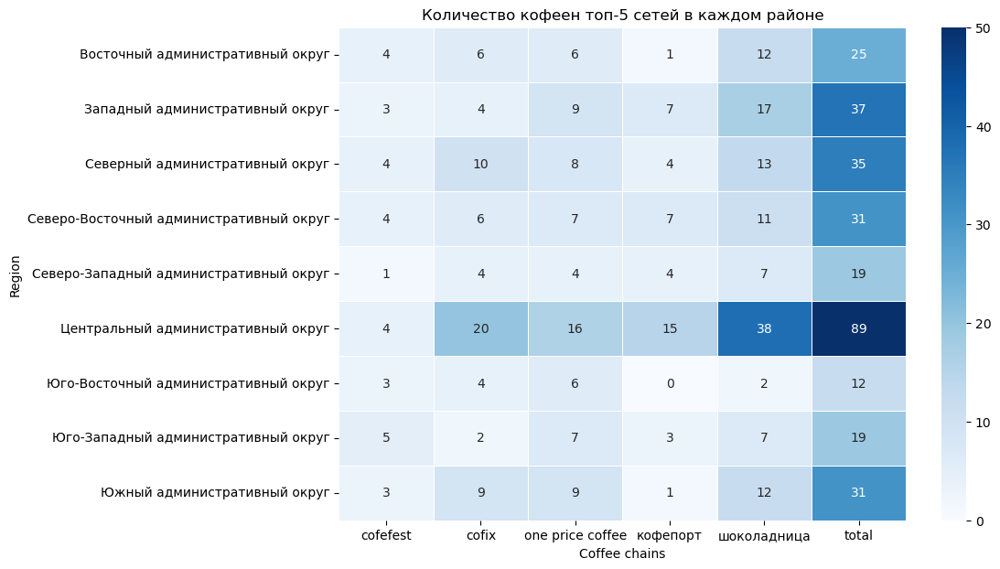

In [66]:
plt.figure(figsize=(10,7))

sns.heatmap(pivot_table_cafe, cmap='Blues', annot=True, linewidth=.5, vmin=0, vmax=50)

plt.title('Количество кофеен топ-5 сетей в каждом районе')
plt.xlabel('Coffee chains')
plt.ylabel('Region')
plt.show()

`Notes`
- In terms of the number of chain coffee houses, CAO is the leader of the top 5 (88 units), CJSC is in third place - (37 units). The gap is almost 60% between first and second place. Further, the number gradually decreases. The lowest number of chain top coffee shops in the South-Eastern District (12 pcs).
- All the top 5 coffee houses are represented in all districts of Moscow, except for one "Kofeport", which is not in the South-Eastern district.
- More than 30% of all Chocolate Girls are located in the Central District. Other coffee houses also have most of their establishments in the CAO.
- One Price Coffee - the second most popular coffee shop also has the most objects in the Central Administrative District.

### Analysis of 24-hour coffee shops

In [67]:
# create a table to determine the number of round-the-clock objects of the coffee shop type
cafe_time = cafe_map.query('is_24_7 == True')['district'].value_counts().reset_index()
cafe_time.columns = ['district', 'count']
cafe_time['district'] = cafe_time['district'].str.split(' ').str[0].str.strip()
print('Number of 24-hour coffee shops:', cafe_time['count'].sum())

Number of 24-hour coffee shops: 59


In [68]:
# schedule for 24/7 coffee shops: county-number
fig = px.bar(cafe_time, x='count', y='district', orientation= 'h',
             color='count', text='count')

fig.update_layout(title='Number of 24-hour coffee houses by administrative districts',
                  xaxis_title='Number of coffee houses',
                  yaxis_title='Adm. districts',
                  showlegend=False)

fig.update_yaxes(categoryorder='total ascending') 

fig.show()

The presence of 24-hour establishments is evidence of high traffic and an active nightlife. As expected, the leader of the list is CAO. Outsiders - South.

### Ratings of coffee houses
We visualize the median value of the rating for coffee shops.

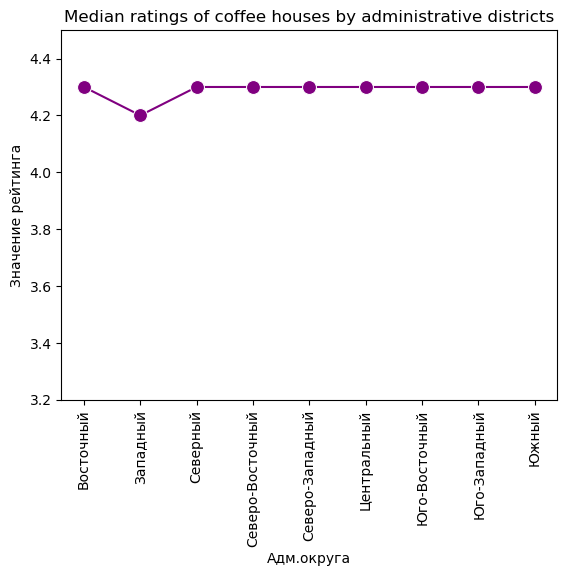

In [69]:
sns.lineplot(x=cafe_total['Адм.округ'], y=cafe_total['Рейтинг медиана'], marker='o', color='purple', markersize=10)

plt.xlabel('Адм.округа')
plt.ylabel('Значение рейтинга')
plt.title('Median ratings of coffee houses by administrative districts')

plt.ylim(3.2, 4.5)
plt.xticks(rotation=90)
plt.show()

All administrative districts have the same rating, except for one - ZAO has a lower rating.

### Cost of a cup of cappuccino

Let's check how the values of the cost of a cup of coffee are distributed.

In [70]:
cafe_map['middle_coffee_cup'].describe(percentiles=[.05, .25, .5, .75, .95])

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
5%         60.000000
25%       124.000000
50%       170.000000
75%       225.000000
95%       275.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

The median value is 170 rubles. But there are also anomalies - 1568 rubles.

We remove the anomalies at the 95th percentile and plot the average cost of a cup of coffee by county.

In [71]:
cafe_cup = cafe_map.query('middle_coffee_cup<=275')
cafe_cup['district'] = cafe_cup['district'].str.split(' ').str[0].str.strip()
cafe_cup['middle_coffee_cup'].describe(percentiles=[.05, .25, .5, .75, .95])

count    499.000000
mean     166.917836
std       61.238057
min       60.000000
5%        60.000000
25%      120.000000
50%      165.000000
75%      218.500000
95%      256.000000
max      275.000000
Name: middle_coffee_cup, dtype: float64

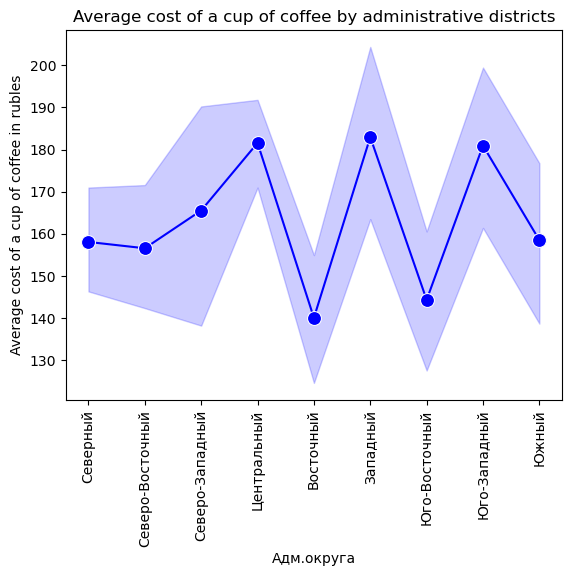

In [72]:
sns.lineplot(x=cafe_cup['district'], y=cafe_cup['middle_coffee_cup'], marker='o', color='blue', markersize=10)

plt.xlabel('Адм.округа')
plt.ylabel('Average cost of a cup of coffee in rubles')
plt.title('Average cost of a cup of coffee by administrative districts')

plt.xticks(rotation=90)
plt.show()

`Notes`
- The leader of the CAO list with a small margin from the "traditional" leader of the CAO
- South-Western district shows a high cost on a par with the Central Administrative District
- East and Southeast have the lowest price
- The median cost of a cup of coffee for all districts is 165 rubles.

## Conclusion 2: Analysis of the “coffee house” category

- Coffee houses - this is 16.8% (1413 units) of the market of public catering establishments in Moscow.


- **Most coffee shops** in the Central District (30%) and this is more than 50% higher than the number of coffee shops in the next Central - Northern District. The reason is high traffic, the concentration of business activity, the presence of educational institutions, government agencies and the presence of tourist flow.


- Coffee houses are present in all districts. In addition, **Central District accounts for 30% of all coffee houses in Moscow**, which indicates the high quality of service and the level of competition. Therefore, the opening of a catering facility in the Central Administrative District will require more investment.


- **50% of coffee shops in the sample have less than 80 seats**. However, the standard deviation is 127, which indicates a large scatter in the data. For a more correct determination of the number of places for a new institution, additional research should be carried out, for example, field studies.


- Like all establishments of any category, coffee houses are concentrated towards the city center. The Southern and Eastern districts are noticeably behind in the number of coffee shops.


- **Number of chain coffee houses** - 720 units, which is more than 22% of the total number of chain establishments in the city of Moscow, which once again confirms the conclusion about high competition in this segment.

- In terms of districts, the Central District traditionally leads in terms of the number of chain coffee houses - 221 chain establishments. This is more than 50% of the next Northern district.


- **Top-5 chain coffee houses:** Shokoladnitsa, One price coffee, Сofix, Coffeeport, Сofefest. All these coffee houses are most represented in the Central Administrative District.


- **Number of 24-hour coffee shops: 59.** This is a small number, but the presence of 24-hour establishments is evidence of high traffic and active nightlife. As expected, the leader of the list in terms of the number of round-the-clock coffee houses is the Central Administrative District.


- **Ratings of coffee shops.** All administrative districts have the same rating (4.3), except for one - CJSC has a lower rating (4.2).


- **Cost of a cup of coffee:** The median cost of a cup of cappuccino for all districts is 165 rubles. The cost should be set based on the median values of each district. For the Central Administrative District and CJSC (the most expensive) - 180 rubles.

## Recommendations for opening a coffee shop

Based on the analysis of data on coffee houses in Moscow, the following recommendations can be made to investors who plan to open a coffee house:

1. **Location:** Explore the possibility of opening a coffee shop in the Central District of the city, as it has the largest number of coffee shops and high traffic. This will provide more opportunities to attract customers and increase the chances of success.


2. **Number of seats:** Analyze data on the number of seats in existing coffee shops. Please note that most coffee shops have less than 80 seats, but there is a significant scatter in the data. Further research, including field studies, is recommended to determine the optimal number of seats for a new establishment.


3. **Coffee chains:** Consider competition from coffee chains. Pay attention to the top 5 coffee chains, which are most represented in the Central District. Study their successful practices and competitive advantages to attract customers and stand out from the competition.


4. **24/7 Operation:** Consider opening a 24/7 coffee shop. The presence of 24-hour establishments indicates high traffic and active nightlife in the area. This can attract additional customers and increase revenue.


5. **Coffee prices:** Determine coffee prices based on the median values for each county. Please note that the Central and Western districts have the highest prices. The cost of a cup of coffee should be competitive, but give a decent profitability.


6. **Quality of Service:** Given the high competition in the coffee shop industry, investors should pay special attention to the quality of service. Provide a high level of customer service and make it one of the key success factors for your establishment.


7. **Marketing and Advertising:** Develop an effective marketing and advertising strategy for your coffee shop. Use social media, create an attractive website and actively promote your establishment in accordance with the preferences of your target audience. Develop a loyalty program to attract and retain customers.